In [1]:
import os
total_images = 0
base_dir = r"D:\coronal_slices_filtered_flattened"

for root, dirs, files in os.walk(base_dir):
    for file in files:
        if file.lower().endswith('.png'):
            total_images += 1

print("Total images in testing folder:", total_images)


Total images in testing folder: 157312


In [5]:
import os
import numpy as np
import pandas as pd
from tqdm import tqdm
from PIL import Image
import torch
import clip
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from torch import nn
from torch.utils.data import DataLoader, TensorDataset

In [3]:
import os
import numpy as np

base_dir = r"D:\coronal_slices_filtered_flattened"
classes = ['AD', 'CN', 'MCI']

def load_split(split):
    paths, labels = [], []
    
    for cls_idx, cls in enumerate(classes):
        class_dir = os.path.join(base_dir, split, cls)
        
        for fname in os.listdir(class_dir):
            if fname.endswith(".png"):
                paths.append(os.path.join(class_dir, fname))
                labels.append(cls_idx)
    
    return np.array(paths), np.array(labels)

# Load splits directly
X_train, y_train = load_split("train")
X_val, y_val     = load_split("val")
X_test, y_test   = load_split("test")

# Check distribution
def print_distribution(name, labels):
    print(f"\n{name} distribution:")
    counts = np.bincount(labels, minlength=3)
    for cls, count in zip(classes, counts):
        print(f"{cls}: {count}")

print_distribution("Train", y_train)
print_distribution("Val", y_val)
print_distribution("Test", y_test)


Train distribution:
AD: 25408
CN: 32704
MCI: 56960

Val distribution:
AD: 5824
CN: 8064
MCI: 7104

Test distribution:
AD: 5888
CN: 8192
MCI: 7168


THE FOLLOWING 3 CODE SNIPPETS ARE FOR FEATURE EXTRACTION THROUGH MOANI FOR TRAIN, VAL AND TEST SETS

In [4]:
import numpy as np
from tqdm import tqdm
import torch
from monai.transforms import Compose, LoadImage, Resize, ScaleIntensity, EnsureChannelFirst, ToTensor
from monai.networks.nets import DenseNet121

# ===== CONFIG =====
BATCH_SIZE = 64
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")

# ===== LOAD PRE-SPLIT DATA =====
train_paths = np.load("train_paths.npy", allow_pickle=True)
train_labels = np.load("train_labels.npy", allow_pickle=True)

# ===== MODEL SETUP =====
full_model = DenseNet121(spatial_dims=2, in_channels=3, out_channels=1, pretrained=True)
feature_extractor = torch.nn.Sequential(*list(full_model.children())[:-1]).to(device)
feature_extractor.eval()

# ===== Standardise the input ======
class EnsureThreeChannel:
    def __call__(self, img):
        if isinstance(img, torch.Tensor):
            # MONAI returns C,H,W format
            if img.shape[0] == 1:  # grayscale → repeat channels
                img = img.repeat(3, 1, 1)
            elif img.shape[0] == 4:  # RGBA → drop alpha
                img = img[:3, :, :]
        else:
            raise ValueError("Expected torch.Tensor input in EnsureThreeChannel")
        return img
    
# ===== CUSTOM TRANSFORM (for grayscale → RGB if needed) =====
class RepeatChannel:
    def __call__(self, img):
        if isinstance(img, np.ndarray):
            img = torch.tensor(img)
        if img.shape[0] == 1:  # grayscale
            return img.repeat(3, 1, 1)
        return img

transform = Compose([
    LoadImage(image_only=True),
    EnsureChannelFirst(),
    Resize((224, 224)),
    ScaleIntensity(),
    ToTensor(),
    EnsureThreeChannel()
])

# ===== FEATURE EXTRACTION =====
features, labels, image_paths = [], [], []

for i in tqdm(range(0, len(train_paths), BATCH_SIZE), desc="Processing Train Set"):
    batch_paths = train_paths[i:i + BATCH_SIZE]
    batch_labels = train_labels[i:i + BATCH_SIZE]

    batch_imgs = []
    valid_labels = []
    valid_paths = []

    for img_path, label in zip(batch_paths, batch_labels):
        try:
            img = transform(img_path).unsqueeze(0)  # Add batch dimension
            batch_imgs.append(img)
            valid_labels.append(label)
            valid_paths.append(img_path)
        except Exception as e:
            print(f"Failed to process {img_path}: {e}")

    if batch_imgs:
        batch_tensor = torch.cat(batch_imgs).to(device)
        with torch.no_grad():
            feats = feature_extractor(batch_tensor).cpu().numpy()

        features.extend(feats)
        labels.extend(valid_labels)
        image_paths.extend(valid_paths)

# ===== SAVE OUTPUTS =====
np.save("train_features_densenet.npy", np.array(features))
np.save("train_labels_densenet.npy", np.array(labels))
np.save("train_image_paths_densenet.npy", np.array(image_paths))

print(f"Saved features: {len(features)}, labels: {len(labels)}, paths: {len(image_paths)})")

d:\Anaconda\envs\py310\lib\site-packages\requests\__init__.py:86: RequestsDependencyWarning: Unable to find acceptable character detection dependency (chardet or charset_normalizer).
  warnings.warn(
Processing Train Set:   0%|          | 0/1198 [00:00<?, ?it/s]

: 

In [ ]:
import numpy as np
from tqdm import tqdm
import torch
from monai.transforms import Compose, LoadImage, Resize, ScaleIntensity, EnsureChannelFirst, ToTensor
from monai.networks.nets import DenseNet121

# ================= CONFIG =================
BATCH_SIZE = 16   # 🔥 safe batch size
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# ================= LOAD DATA =================
train_paths = np.load("train_paths.npy", allow_pickle=True)
train_labels = np.load("train_labels.npy", allow_pickle=True)

# ================= MODEL =================
model = DenseNet121(
    spatial_dims=2,
    in_channels=3,
    out_channels=1,
    pretrained=True
).to(device)

# Remove classification layer → feature extractor
feature_extractor = torch.nn.Sequential(*list(model.children())[:-1]).to(device)
feature_extractor.eval()

# ================= TRANSFORM =================
class EnsureThreeChannel:
    def __call__(self, img):
        if isinstance(img, torch.Tensor):
            if img.shape[0] == 1:   # grayscale → RGB
                img = img.repeat(3, 1, 1)
            elif img.shape[0] > 3:  # drop extra channels
                img = img[:3, :, :]
        return img

transform = Compose([
    LoadImage(image_only=True),
    EnsureChannelFirst(),
    Resize((128, 128)),   # 🔥 reduced size (memory safe)
    ScaleIntensity(),
    ToTensor(),
    EnsureThreeChannel()
])

# ================= FEATURE EXTRACTION =================
all_features = []
all_labels = []
all_paths = []

for i in tqdm(range(0, len(train_paths), BATCH_SIZE), desc="Processing Train Set"):
    batch_paths = train_paths[i:i + BATCH_SIZE]
    batch_labels = train_labels[i:i + BATCH_SIZE]

    batch_imgs = []

    for path in batch_paths:
        try:
            img = transform(path)
            batch_imgs.append(img)
        except Exception as e:
            print(f"Error loading {path}: {e}")

    if len(batch_imgs) == 0:
        continue

    batch_tensor = torch.stack(batch_imgs).to(device)

    with torch.no_grad():
        feats = feature_extractor(batch_tensor)

    # Flatten features
    feats = feats.view(feats.size(0), -1).cpu().numpy()

    all_features.append(feats)
    all_labels.append(batch_labels)
    all_paths.extend(batch_paths)

    # 🔥 free memory
    del batch_tensor, feats
    torch.cuda.empty_cache()

# ================= SAVE =================
all_features = np.concatenate(all_features)
all_labels = np.concatenate(all_labels)

np.save("train_features_densenet.npy", all_features)
np.save("train_labels_densenet.npy", all_labels)
np.save("train_image_paths_densenet.npy", all_paths)

print("\n✅ Feature extraction complete!")
print(f"Features shape: {all_features.shape}")
print(f"Labels shape: {all_labels.shape}")

d:\Anaconda\envs\py310\lib\site-packages\requests\__init__.py:86: RequestsDependencyWarning: Unable to find acceptable character detection dependency (chardet or charset_normalizer).
  warnings.warn(


In [1]:
import torch
print(torch.cuda.is_available())
print(torch.cuda.device_count())
print(torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU")

True
1
NVIDIA GeForce RTX 4050 Laptop GPU


In [1]:
import numpy as np
from tqdm import tqdm
import torch
import os
from monai.transforms import Compose, LoadImage, Resize, ScaleIntensity, EnsureChannelFirst, ToTensor
from torchvision.models import resnet18

# ================= CONFIG =================
BATCH_SIZE = 8  # ✅ safe for RTX 4050
device = torch.device("cuda")
SAVE_DIR = "features_chunks"
os.makedirs(SAVE_DIR, exist_ok=True)

print("Using device:", device)

# ================= LOAD DATA =================
train_paths = np.load("train_paths.npy", allow_pickle=True)
train_labels = np.load("train_labels.npy", allow_pickle=True)

# ================= MODEL =================
model = resnet18(pretrained=True)
model = torch.nn.Sequential(*list(model.children())[:-1]).to(device)
model.eval()

# ================= TRANSFORM =================
class EnsureThreeChannel:
    def __call__(self, img):
        if img.shape[0] == 1:
            img = img.repeat(3, 1, 1)
        elif img.shape[0] > 3:
            img = img[:3]
        return img

transform = Compose([
    LoadImage(image_only=True),
    EnsureChannelFirst(),
    Resize((128, 128)),   # ✅ balanced size
    ScaleIntensity(),
    ToTensor(),
    EnsureThreeChannel()
])

# ================= FEATURE EXTRACTION =================
chunk_id = 0

for i in tqdm(range(0, len(train_paths), BATCH_SIZE), desc="Processing"):
    batch_paths = train_paths[i:i + BATCH_SIZE]
    batch_labels = train_labels[i:i + BATCH_SIZE]

    batch_imgs = []

    for path in batch_paths:
        try:
            img = transform(path)
            batch_imgs.append(img)
        except Exception as e:
            print(f"Error: {e}")

    if len(batch_imgs) == 0:
        continue

    batch_tensor = torch.stack(batch_imgs).to(device)

    with torch.no_grad():
        feats = model(batch_tensor)

    feats = feats.view(feats.size(0), -1).cpu().numpy()

    # ✅ Save immediately (prevents RAM overflow)
    np.save(os.path.join(SAVE_DIR, f"features_{chunk_id}.npy"), feats)
    np.save(os.path.join(SAVE_DIR, f"labels_{chunk_id}.npy"), batch_labels)

    chunk_id += 1

    # 🔥 free GPU memory
    del batch_tensor, feats, batch_imgs
    torch.cuda.empty_cache()

print("\n✅ Feature extraction complete!")

d:\Anaconda\envs\py310\lib\site-packages\requests\__init__.py:86: RequestsDependencyWarning: Unable to find acceptable character detection dependency (chardet or charset_normalizer).
  warnings.warn(


Using device: cuda


d:\Anaconda\envs\py310\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Anaconda\envs\py310\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Processing: 100%|██████████| 9584/9584 [08:07<00:00, 19.66it/s]


✅ Feature extraction complete!


In [2]:
import numpy as np
import os
from tqdm import tqdm
import torch
from monai.transforms import Compose, LoadImage, Resize, ScaleIntensity, EnsureChannelFirst, ToTensor
from monai.networks.nets import DenseNet121

# ================= CONFIG =================
BATCH_SIZE = 8  # ✅ safe for RTX 4050
device = torch.device("cuda")
SAVE_DIR = "features_chunks"
os.makedirs(SAVE_DIR, exist_ok=True)

print("Using device:", device)


# ===== LOAD PRE-SPLIT DATA =====
val_paths = np.load("val_paths.npy", allow_pickle=True)
val_labels = np.load("val_labels.npy", allow_pickle=True)

# ===== MODEL SETUP =====
full_model = DenseNet121(spatial_dims=2, in_channels=3, out_channels=1, pretrained=True)
feature_extractor = torch.nn.Sequential(*list(full_model.children())[:-1]).to(device)
feature_extractor.eval()

# ===== Standardise the input ======
class EnsureThreeChannel:
    def __call__(self, img):
        if isinstance(img, torch.Tensor):
            # MONAI returns C,H,W format
            if img.shape[0] == 1:  # grayscale → repeat channels
                img = img.repeat(3, 1, 1)
            elif img.shape[0] == 4:  # RGBA → drop alpha
                img = img[:3, :, :]
        else:
            raise ValueError("Expected torch.Tensor input in EnsureThreeChannel")
        return img
    
# ===== CUSTOM TRANSFORM (for grayscale → RGB if needed) =====
class RepeatChannel:
    def __call__(self, img):
        if isinstance(img, np.ndarray):
            img = torch.tensor(img)
        if img.shape[0] == 1:  # grayscale
            return img.repeat(3, 1, 1)
        return img

transform = Compose([
    LoadImage(image_only=True),
    EnsureChannelFirst(),
    Resize((224, 224)),
    ScaleIntensity(),
    ToTensor(),
    EnsureThreeChannel()
])

# ===== FEATURE EXTRACTION =====
features, labels, image_paths = [], [], []

for i in tqdm(range(0, len(val_paths), BATCH_SIZE), desc="Processing val Set"):
    batch_paths = val_paths[i:i + BATCH_SIZE]
    batch_labels = val_labels[i:i + BATCH_SIZE]

    batch_imgs = []
    valid_labels = []
    valid_paths = []

    for img_path, label in zip(batch_paths, batch_labels):
        try:
            img = transform(img_path).unsqueeze(0)  # Add batch dimension
            batch_imgs.append(img)
            valid_labels.append(label)
            valid_paths.append(img_path)
        except Exception as e:
            print(f"Failed to process {img_path}: {e}")

    if batch_imgs:
        batch_tensor = torch.cat(batch_imgs).to(device)
        with torch.no_grad():
            feats = feature_extractor(batch_tensor).cpu().numpy()

        features.extend(feats)
        labels.extend(valid_labels)
        image_paths.extend(valid_paths)

# ===== SAVE OUTPUTS =====
np.save("val_features_densenet.npy", np.array(features))
np.save("val_labels_densenet.npy", np.array(labels))
np.save("val_image_paths_densenet.npy", np.array(image_paths))

print(f"Saved features: {len(features)}, labels: {len(labels)}, paths: {len(image_paths)})")

Using device: cuda


Processing val Set: 100%|██████████| 2584/2584 [03:56<00:00, 10.93it/s]


Saved features: 20672, labels: 20672, paths: 20672)


In [1]:
import numpy as np
import os
from tqdm import tqdm
import torch
from monai.transforms import Compose, LoadImage, Resize, ScaleIntensity, EnsureChannelFirst, ToTensor
from monai.networks.nets import DenseNet121

# ================= CONFIG =================
BATCH_SIZE = 8  # ✅ safe for RTX 4050
device = torch.device("cuda")
SAVE_DIR = "features_chunks"
os.makedirs(SAVE_DIR, exist_ok=True)

print("Using device:", device)


# ===== LOAD PRE-SPLIT DATA =====
test_paths = np.load("test_paths.npy", allow_pickle=True)
test_labels = np.load("test_labels.npy", allow_pickle=True)

# ===== MODEL SETUP =====
full_model = DenseNet121(spatial_dims=2, in_channels=3, out_channels=1, pretrained=True)
feature_extractor = torch.nn.Sequential(*list(full_model.children())[:-1]).to(device)
feature_extractor.eval()

# ===== Standardise the input ======
class EnsureThreeChannel:
    def __call__(self, img):
        if isinstance(img, torch.Tensor):
            # MONAI returns C,H,W format
            if img.shape[0] == 1:  # grayscale → repeat channels
                img = img.repeat(3, 1, 1)
            elif img.shape[0] == 4:  # RGBA → drop alpha
                img = img[:3, :, :]
        else:
            raise ValueError("Expected torch.Tensor input in EnsureThreeChannel")
        return img
    
# ===== CUSTOM TRANSFORM (for grayscale → RGB if needed) =====
class RepeatChannel:
    def __call__(self, img):
        if isinstance(img, np.ndarray):
            img = torch.tensor(img)
        if img.shape[0] == 1:  # grayscale
            return img.repeat(3, 1, 1)
        return img

transform = Compose([
    LoadImage(image_only=True),
    EnsureChannelFirst(),
    Resize((224, 224)),
    ScaleIntensity(),
    ToTensor(),
    EnsureThreeChannel()
])

# ===== FEATURE EXTRACTION =====
features, labels, image_paths = [], [], []

for i in tqdm(range(0, len(test_paths), BATCH_SIZE), desc="Processing test Set"):
    batch_paths = test_paths[i:i + BATCH_SIZE]
    batch_labels = test_labels[i:i + BATCH_SIZE]

    batch_imgs = []
    testid_labels = []
    testid_paths = []

    for img_path, label in zip(batch_paths, batch_labels):
        try:
            img = transform(img_path).unsqueeze(0)  # Add batch dimension
            batch_imgs.append(img)
            testid_labels.append(label)
            testid_paths.append(img_path)
        except Exception as e:
            print(f"Failed to process {img_path}: {e}")

    if batch_imgs:
        batch_tensor = torch.cat(batch_imgs).to(device)
        with torch.no_grad():
            feats = feature_extractor(batch_tensor).cpu().numpy()

        features.extend(feats)
        labels.extend(testid_labels)
        image_paths.extend(testid_paths)

# ===== SAVE OUTPUTS =====
np.save("test_features_densenet.npy", np.array(features))
np.save("test_labels_densenet.npy", np.array(labels))
np.save("test_image_paths_densenet.npy", np.array(image_paths))

print(f"Saved features: {len(features)}, labels: {len(labels)}, paths: {len(image_paths)})")

d:\Anaconda\envs\py310\lib\site-packages\requests\__init__.py:86: RequestsDependencyWarning: Unable to find acceptable character detection dependency (chardet or charset_normalizer).
  warnings.warn(


Using device: cuda


Processing test Set: 100%|██████████| 2216/2216 [03:13<00:00, 11.47it/s]


Saved features: 17728, labels: 17728, paths: 17728)


In [7]:
import os
import torch
import clip
from PIL import Image
import numpy as np
from tqdm import tqdm
import imgaug.augmenters as iaa
from tensorflow.keras.applications.efficientnet import EfficientNetB0, preprocess_input
# from tensorflow.keras.applications import DenseNet121.  # densenet code
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense
import torchvision.transforms as T

# ===== Load training split =====
train_paths = np.load("train_paths.npy", allow_pickle=True)
train_labels = np.load("train_labels.npy", allow_pickle=True)


# Extracting CLIP Image features
model, preprocess_clip = clip.load("ViT-B/32", device=device)
features, labels, image_paths = [], [], []
skipped_images = []

# Loop through training images
for img_path, label in tqdm(zip(train_paths, train_labels), total=len(train_paths), desc="Processing train Images"):
    try:
        pil_img = Image.open(img_path).convert("RGB")
        img_tensor = preprocess_clip(pil_img).unsqueeze(0).to(device)

        with torch.no_grad():
            feat = model.encode_image(img_tensor).cpu().numpy().flatten()

        features.append(feat)
        labels.append(label)
        image_paths.append(img_path)

    except Exception as e:
        print(f"Failed to process {img_path}: {e}")
        skipped_images.append(img_path)

# Save results
features = np.array(features)
labels = np.array(labels)
image_paths = np.array(image_paths)
print(features.shape)

np.save("train_features_coronal.npy", features)
np.save("train_labels_coronal.npy", labels)
np.save("train_image_paths_coronal.npy", image_paths)

print(f" Features saved. Total processed: {len(features)} (expected: {len(train_paths) })")
print(f" Skipped images: {len(skipped_images)}")

Processing train Images: 100%|██████████| 76672/76672 [23:23<00:00, 54.63it/s]  


(76672, 512)
 Features saved. Total processed: 76672 (expected: 76672)
 Skipped images: 0


(76672, 512)


d:\Anaconda\envs\py310\lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
d:\Anaconda\envs\py310\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


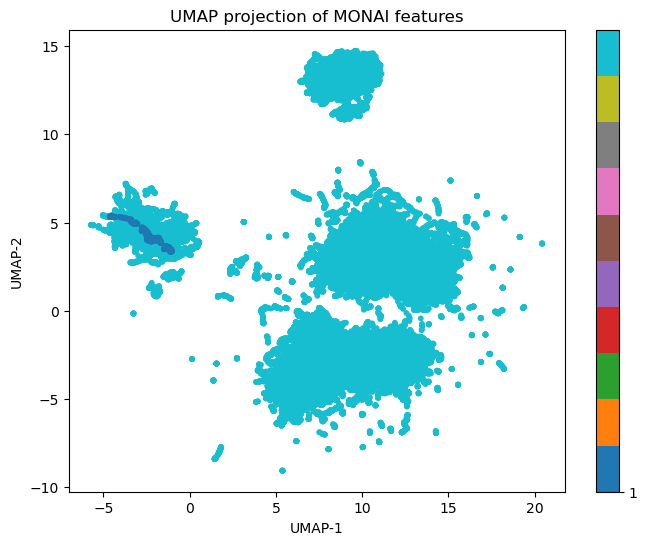

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import umap
from sklearn.preprocessing import StandardScaler

# Load features and labels
features = np.load("train_features_coronal.npy") # change this to 'train_features_coronal.npy' for clip features
labels = np.load("train_labels_coronal.npy")       # change this to 'train_labels_coronal.npy' for clip features

features_reshaped = features.reshape(features.shape[0], -1)
print(features_reshaped.shape)

# Optional: scale features (UMAP often works better after scaling)
features_scaled = StandardScaler().fit_transform(features_reshaped)

# Initialize and fit UMAP
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
embedding = reducer.fit_transform(features_scaled)  # shape: (n_samples, 2)

# Plot
plt.figure(figsize=(8, 6))
scatter = plt.scatter(embedding[:, 0], embedding[:, 1], c=labels, cmap='tab10', s=10)
plt.colorbar(scatter, ticks=range(len(np.unique(labels))))
plt.title("UMAP projection of MONAI features")
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.show()

same process as above for validation data

In [12]:
import os
import numpy as np
from tqdm import tqdm
import imgaug.augmenters as iaa
from tensorflow.keras.applications.efficientnet import EfficientNetB0, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense
import torchvision.transforms as T

# ===== Load valing split =====
val_paths = np.load("val_paths.npy", allow_pickle=True)
val_labels = np.load("val_labels.npy", allow_pickle=True)


# Extracting CLIP Image features
model, preprocess_clip = clip.load("ViT-B/32", device=device)
features, labels, image_paths = [], [], []
skipped_images = []

# Loop through valing images
for img_path, label in tqdm(zip(val_paths, val_labels), total=len(val_paths), desc="Processing Val Images"):
    try:
        pil_img = Image.open(img_path).convert("RGB")
        img_tensor = preprocess_clip(pil_img).unsqueeze(0).to(device)

        with torch.no_grad():
            feat = model.encode_image(img_tensor).cpu().numpy().flatten()

        features.append(feat)
        labels.append(label)
        image_paths.append(img_path)

    except Exception as e:
        print(f"Failed to process {img_path}: {e}")
        skipped_images.append(img_path)

# Save results
features = np.array(features)
labels = np.array(labels)
image_paths = np.array(image_paths)

np.save("val_features_coronal.npy", features)
np.save("val_labels_coronal.npy", labels)
np.save("val_image_paths_coronal.npy", image_paths)

print(f" Features saved. Total processed: {len(features)} (expected: {len(val_paths) })")
print(f" Skipped images: {len(skipped_images)}")

Processing Val Images: 100%|██████████| 20672/20672 [06:45<00:00, 50.95it/s]

 Features saved. Total processed: 20672 (expected: 20672)
 Skipped images: 0


In [15]:
import os
import numpy as np
import clip
from PIL import Image
from tqdm import tqdm
import torch
import clip
from PIL import Image

# ===== Load testing split =====
test_paths = np.load("test_paths.npy", allow_pickle=True)
test_labels = np.load("test_labels.npy", allow_pickle=True)

# Load CLIP model (ViT-B/32)
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess_clip = clip.load("ViT-B/32", device=device)

features, labels, image_paths = [], [], []
skipped_images = []

# Loop through test images (no augmentation)
for img_path, label in tqdm(zip(test_paths, test_labels), total=len(test_paths), desc="Processing Test Images"):
    try:
        pil_img = Image.open(img_path).convert("RGB")

        # Preprocess for CLIP
        img_tensor = preprocess_clip(pil_img).unsqueeze(0).to(device)

        # Extract features
        with torch.no_grad():
            feat = model.encode_image(img_tensor).cpu().numpy().flatten()

        features.append(feat)
        labels.append(label)
        image_paths.append(img_path)

    except Exception as e:
        print(f"Failed to process {img_path}: {e}")
        skipped_images.append(img_path)

# Save results
features = np.array(features)
labels = np.array(labels)
image_paths = np.array(image_paths)

np.save("test_features_coronal.npy", features)
np.save("test_labels_coronal.npy", labels)
np.save("test_image_paths_coronal.npy", image_paths)

print(f" Test features saved. Total processed: {len(features)} / {len(test_paths)}")
print(f" Skipped images: {len(skipped_images)}")

Processing Test Images: 100%|██████████| 17728/17728 [06:59<00:00, 42.24it/s]

 Test features saved. Total processed: 17728 / 17728
 Skipped images: 0


In [18]:
features = np.load("train_features_coronal.npy")      # change this to 'train_features_coronal.npy' for clip features
features = features.reshape(features.shape[0], -1)
print(features.shape)
labels = np.load("train_labels_coronal.npy")          
print(labels.shape)
image_paths = np.load("train_image_paths_coronal.npy") 
print(image_paths.shape)


(76672, 512)
(76672,)
(76672,)


In [19]:
features = np.load("val_features_coronal.npy")      # change this to 'val_features_coronal.npy' for clip features
features = features.reshape(features.shape[0], -1)
print(features.shape)
labels = np.load("val_labels_coronal.npy")          
print(labels.shape)
image_paths = np.load("val_image_paths_coronal.npy")
print(image_paths.shape)


(20672, 512)
(20672,)
(20672,)


In [20]:
features = np.load("test_features_coronal.npy")      # change this to 'test_features_coronal.npy' for clip features
features = features.reshape(features.shape[0], -1)
print(features.shape)
labels = np.load("test_labels_coronal.npy")          
print(labels.shape)
image_paths = np.load("test_image_paths_coronal.npy") 
print(image_paths.shape)


(17728, 512)
(17728,)
(17728,)


In [21]:
# Load the .npy files
import pandas as pd
features = np.load("train_features_coronal.npy")     # change this to 'train_features_coronal.npy' for clip features  
labels = np.load("train_labels_coronal.npy")           
features = features.reshape(features.shape[0], -1)

# Combine features and labels
combined = np.hstack((features, labels.reshape(-1, 1))) 

# Create a DataFrame
df = pd.DataFrame(combined)

# Optionally name columns

feature_columns = [f"f{i}" for i in range(features.shape[1])]
df.columns = feature_columns + ["label"]

# Save to CSV
df.to_csv("train_densenet_features_and_labels_only.csv", index=False)

print(" Saved: train_densenet_features_and_labels_only.csv")


 Saved: train_densenet_features_and_labels_only.csv


same process for validation set

In [22]:
# Load the .npy files
features = np.load("val_features_coronal.npy")       # change this to 'val_features_coronal.npy' for clip features
features = np.load("val_features_coronal.npy")       
labels = np.load("val_labels_coronal.npy")           
features = features.reshape(features.shape[0], -1)

# Combine features and labels
combined = np.hstack((features, labels.reshape(-1, 1)))  

# Create a DataFrame
df = pd.DataFrame(combined)

# Optionally name columns
feature_columns = [f"f{i}" for i in range(features.shape[1])]
df.columns = feature_columns + ["label"]

# Save to CSV
df.to_csv("val_densenet_features_and_labels_only.csv", index=False)

print(" Saved: val_densenet_features_and_labels_only.csv")


 Saved: val_densenet_features_and_labels_only.csv


In [23]:
# Load the .npy files
features = np.load("test_features_coronal.npy")       # change this to 'test_features_coronal.npy' for clip features
labels = np.load("test_labels_coronal.npy")           
features = features.reshape(features.shape[0], -1)

# Combine features and labels
combined = np.hstack((features, labels.reshape(-1, 1)))

# Create a DataFrame
df = pd.DataFrame(combined)

# Optionally name columns
feature_columns = [f"f{i}" for i in range(features.shape[1])]
df.columns = feature_columns + ["label"]

# Save to CSV
df.to_csv("test_densenet_features_and_labels_only.csv", index=False)

print(" Saved: test_densenet_features_and_labels_only.csv")


 Saved: test_densenet_features_and_labels_only.csv


In [5]:
# for text embeddings
import pandas as pd

# Load your file
df = pd.read_csv("D:\\ADNI1_Merged_AllImages.csv")

# Preview the first few rows
print(df.shape)
df.head()


(2294, 51)


,Image Data ID,Subject,Group,Sex,Age,Visit,Modality,Description,Type,Acq Date,...,AXCRYING,AXELMOOD,AXWANDER,AXFALL,AXOTHER,ID,SITEID,USERDATE,USERDATE2,update_stamp
0,I112538,941_S_1311,MCI,M,70,m12,MRI,MPR; GradWarp; B1 Correction; N3; Scaled,Processed,6/1/2008,...,1.0,1.0,1.0,1.0,1.0,4150.0,127.0,5/5/2008,NaN,00:00.0
1,I97341,941_S_1311,MCI,M,70,m06,MRI,MPR-R; GradWarp; B1 Correction; N3; Scaled,Processed,9/27/2007,...,1.0,1.0,1.0,1.0,2.0,2370.0,127.0,9/18/2007,NaN,00:00.0
2,I97327,941_S_1311,MCI,M,69,sc,MRI,MPR; GradWarp; B1 Correction; N3; Scaled,Processed,3/2/2007,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,I63874,941_S_1202,CN,M,78,sc,MRI,MPR-R; GradWarp; B1 Correction; N3; Scaled,Processed,1/30/2007,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,I75150,941_S_1202,CN,M,78,m06,MRI,MPR; GradWarp; B1 Correction; N3; Scaled,Processed,8/24/2007,...,1.0,1.0,1.0,2.0,1.0,2110.0,127.0,8/15/2007,NaN,00:00.0


In [6]:
import pandas as pd
import clip
import torch
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)
# Remove label 
df_cleaned = df.drop(columns=["Group", "Downloaded", "Modality", "Type", "Format", "Visit", "VISCODE", "VISCODE2", "USERDATE", "USERDATE2", "update_stamp", "Acq Date", "PTID", "RID", "ID", "SITEID"])

# Keep Image ID separately for future mapping
image_ids = df_cleaned["Image Data ID"].values

# Drop ID from the text encoding input
text_only = df_cleaned.drop(columns=["Image Data ID"])

# Convert each row to string and generate sentence embeddings
texts = text_only.astype(str).agg(" ".join, axis=1).tolist()
texts = [t.lower().strip() for t in texts]

# Tokenize all text using CLIP
text_tokens = clip.tokenize(texts, truncate=True).to(device)

# Generate text embeddings
with torch.no_grad():
    text_embeddings = model.encode_text(text_tokens).cpu().numpy()  # shape: (n_samples, 512)
# Save with Image IDs
import numpy as np
np.save("text_embeddings_cleaned.npy", text_embeddings)
np.save("text_image_ids.npy", image_ids)


In [7]:
import numpy as np
import pandas as pd

# Load the cleaned text embeddings and associated image IDs
text_embeddings = np.load("text_embeddings_cleaned.npy")           # shape: (2294, 512)
text_image_ids = np.load("text_image_ids.npy", allow_pickle=True)  # shape: (2294,)

# Convert to DataFrame and add IDs as the first column
df = pd.DataFrame(text_embeddings)
df.insert(0, "Image_ID", text_image_ids)                            # shape: (2294, 513)

# Save to CSV
df.to_csv("text_embeddings_cleaned_with_ids.csv", index=False)

print(" Saved: text_embeddings_cleaned_with_ids.csv")
print(" Shape:", df.shape)


 Saved: text_embeddings_cleaned_with_ids.csv
 Shape: (2294, 513)


In [8]:
text_embeddings = np.load("text_embeddings_cleaned.npy")  
text_ids = np.load("text_image_ids.npy", allow_pickle=True)

# Build lookup
text_lookup = {tid: emb for tid, emb in zip(text_ids, text_embeddings)}

def get_text_features_for_split(image_paths, image_labels):
    feats, labels = [], []
    for path, label in zip(image_paths, image_labels):
        parts = os.path.basename(path).split('_')
        sid = parts[0]
        if sid == "aug" and len(parts) > 2:
            sid = parts[2]  # use the 3rd part if augmented
        
        if sid in text_lookup:
            feats.append(text_lookup[sid])
            labels.append(label)
        else:
            print(f"[WARN] Missing text embedding for {sid} (from {path})")
    
    return np.array(feats), np.array(labels)

# Train text features
train_paths = np.load("train_image_paths_coronal.npy", allow_pickle=True)
print(train_paths.shape)
train_labels = np.load("train_labels_coronal.npy", allow_pickle=True)
train_text_feats, train_text_labels = get_text_features_for_split(train_paths, train_labels)

np.save("train_text_features.npy", train_text_feats)
np.save("train_text_labels.npy", train_text_labels)

print("Saved: train_text_features.npy", train_text_feats.shape)
print("train_text_labels.npy", train_text_labels.shape)

(76672,)
[WARN] Missing text embedding for 941 (from D:\coronal_slices_filtered_flattened\train\MCI\941_S_1311_I112538_MCI_slice_0059.png)
[WARN] Missing text embedding for 941 (from D:\coronal_slices_filtered_flattened\train\MCI\941_S_1311_I112538_MCI_slice_0060.png)
[WARN] Missing text embedding for 941 (from D:\coronal_slices_filtered_flattened\train\MCI\941_S_1311_I112538_MCI_slice_0061.png)
[WARN] Missing text embedding for 941 (from D:\coronal_slices_filtered_flattened\train\MCI\941_S_1311_I112538_MCI_slice_0062.png)
[WARN] Missing text embedding for 941 (from D:\coronal_slices_filtered_flattened\train\MCI\941_S_1311_I112538_MCI_slice_0063.png)
[WARN] Missing text embedding for 941 (from D:\coronal_slices_filtered_flattened\train\MCI\941_S_1311_I112538_MCI_slice_0064.png)
[WARN] Missing text embedding for 941 (from D:\coronal_slices_filtered_flattened\train\MCI\941_S_1311_I112538_MCI_slice_0065.png)
[WARN] Missing text embedding for 941 (from D:\coronal_slices_filtered_flattened\

In [9]:
import numpy as np
import os
import re

# =========================
# LOAD TEXT EMBEDDINGS
# =========================
text_embeddings = np.load("text_embeddings_cleaned.npy")  
text_ids = np.load("text_image_ids.npy", allow_pickle=True)

# Ensure IDs are strings (IMPORTANT)
text_ids = text_ids.astype(str)

# Build lookup dictionary
text_lookup = {tid: emb for tid, emb in zip(text_ids, text_embeddings)}

print("Total text embeddings:", len(text_lookup))


# =========================
# EXTRACT IMAGE DATA ID
# =========================
def extract_image_id(filename):
    """
    Extracts Image Data ID like 'I112538' from filename
    Example:
    941_S_1311_I112538_MCI_slice_0059.png → I112538
    """
    match = re.search(r'I\d+', filename)
    return match.group(0) if match else None


# =========================
# MAP TEXT FEATURES
# =========================
def get_text_features_for_split(image_paths, image_labels):
    feats, labels = [], []
    missing_count = 0

    for path, label in zip(image_paths, image_labels):
        filename = os.path.basename(path)
        sid = extract_image_id(filename)   # ✅ FIXED

        if sid is None:
            print(f"[WARN] Could not extract ID from {filename}")
            missing_count += 1
            continue

        if sid in text_lookup:
            feats.append(text_lookup[sid])
            labels.append(label)
        else:
            print(f"[WARN] Missing text embedding for {sid} (from {filename})")
            missing_count += 1

    print("\n===== SUMMARY =====")
    print("Total samples:", len(image_paths))
    print("Matched samples:", len(feats))
    print("Missing samples:", missing_count)

    return np.array(feats), np.array(labels)


# =========================
# LOAD TRAIN DATA
# =========================
train_paths = np.load("train_image_paths_coronal.npy", allow_pickle=True)
train_labels = np.load("train_labels_coronal.npy", allow_pickle=True)

print("Train paths shape:", train_paths.shape)


# =========================
# EXTRACT FEATURES
# =========================
train_text_feats, train_text_labels = get_text_features_for_split(
    train_paths, train_labels
)


# =========================
# SAVE OUTPUT
# =========================
np.save("train_text_features.npy", train_text_feats)
np.save("train_text_labels.npy", train_text_labels)

print("\nSaved:")
print("train_text_features.npy:", train_text_feats.shape)
print("train_text_labels.npy:", train_text_labels.shape)

Total text embeddings: 2294
Train paths shape: (76672,)

===== SUMMARY =====
Total samples: 76672
Matched samples: 76672
Missing samples: 0

Saved:
train_text_features.npy: (76672, 512)
train_text_labels.npy: (76672,)


In [37]:
text_embeddings = np.load("text_embeddings_cleaned.npy") 
text_ids = np.load("text_image_ids.npy", allow_pickle=True)

# Build lookup
text_lookup = {tid: emb for tid, emb in zip(text_ids, text_embeddings)}

def get_text_features_for_split(image_paths, image_labels):
    feats, labels = [], []
    for path, label in zip(image_paths, image_labels):
        parts = os.path.basename(path).split('_')
        sid = parts[0]
        if sid == "aug" and len(parts) > 2:
            sid = parts[2]  # use the 3rd part if augmented
        
        if sid in text_lookup:
            feats.append(text_lookup[sid])
            labels.append(label)
        else:
            print(f"[WARN] Missing text embedding for {sid} (from {path})")
    
    return np.array(feats), np.array(labels)

# val text features
val_paths = np.load("val_image_paths_densenet.npy", allow_pickle=True)
val_labels = np.load("val_labels_densenet.npy", allow_pickle=True)
val_text_feats, val_text_labels = get_text_features_for_split(val_paths, val_labels)

np.save("val_text_features.npy", val_text_feats)
np.save("val_text_labels.npy", val_text_labels)

print("Saved: val_text_features.npy", val_text_feats.shape)
print("val_text_labels.npy", val_text_labels.shape)

[WARN] Missing text embedding for 027 (from D:\coronal_slices_filtered_flattened\train\AD\027_S_0404_I34204_AD_slice_0079.png)
[WARN] Missing text embedding for 027 (from D:\coronal_slices_filtered_flattened\train\AD\027_S_0404_I34204_AD_slice_0080.png)
[WARN] Missing text embedding for 027 (from D:\coronal_slices_filtered_flattened\train\AD\027_S_0404_I34204_AD_slice_0081.png)
[WARN] Missing text embedding for 027 (from D:\coronal_slices_filtered_flattened\train\AD\027_S_0404_I34204_AD_slice_0082.png)
[WARN] Missing text embedding for 027 (from D:\coronal_slices_filtered_flattened\train\AD\027_S_0404_I34204_AD_slice_0083.png)
[WARN] Missing text embedding for 027 (from D:\coronal_slices_filtered_flattened\train\AD\027_S_0404_I34204_AD_slice_0084.png)
[WARN] Missing text embedding for 027 (from D:\coronal_slices_filtered_flattened\train\AD\027_S_0404_I34204_AD_slice_0085.png)
[WARN] Missing text embedding for 027 (from D:\coronal_slices_filtered_flattened\train\AD\027_S_0404_I34204_AD_

In [10]:
import numpy as np
import os
import re
from sklearn.preprocessing import StandardScaler

# =========================
# LOAD TEXT EMBEDDINGS
# =========================
text_embeddings = np.load("text_embeddings_cleaned.npy")  
text_ids = np.load("text_image_ids.npy", allow_pickle=True)

# Ensure IDs are strings (CRITICAL)
text_ids = text_ids.astype(str)

# Build lookup dictionary
text_lookup = {tid: emb for tid, emb in zip(text_ids, text_embeddings)}

print("Total text embeddings:", len(text_lookup))


# =========================
# ID EXTRACTION (FIXED)
# =========================
def extract_image_id(filename):
    match = re.search(r'I\d+', filename)
    return match.group(0) if match else None


# =========================
# FEATURE EXTRACTION FUNCTION
# =========================
def get_text_features_for_split(image_paths, image_labels):
    feats, labels = [], []
    missing_count = 0

    for path, label in zip(image_paths, image_labels):
        filename = os.path.basename(path)
        sid = extract_image_id(filename)

        if sid is None:
            print(f"[WARN] Could not extract ID from {filename}")
            missing_count += 1
            continue

        if sid in text_lookup:
            feats.append(text_lookup[sid])
            labels.append(label)
        else:
            print(f"[WARN] Missing text embedding for {sid} (from {filename})")
            missing_count += 1

    print("\n===== SUMMARY =====")
    print("Total samples:", len(image_paths))
    print("Matched samples:", len(feats))
    print("Missing samples:", missing_count)

    return np.array(feats), np.array(labels)


# =========================
# LOAD VALIDATION DATA
# =========================
val_paths = np.load("val_image_paths_densenet.npy", allow_pickle=True)
val_labels = np.load("val_labels_densenet.npy", allow_pickle=True)

print("Val paths shape:", val_paths.shape)


# =========================
# EXTRACT FEATURES
# =========================
val_text_feats, val_text_labels = get_text_features_for_split(val_paths, val_labels)


# =========================
# IMPORTANT: USE SAME SCALER AS TRAIN
# =========================
# Load scaler fitted on TRAIN data
scaler = StandardScaler()

# ⚠️ You MUST fit on train, NOT val
train_text_feats = np.load("train_text_features.npy")
scaler.fit(train_text_feats)

# Transform validation using same scaler
val_text_feats = scaler.transform(val_text_feats)


# =========================
# SAVE OUTPUT
# =========================
np.save("val_text_features.npy", val_text_feats)
np.save("val_text_labels.npy", val_text_labels)

print("\nSaved:")
print("val_text_features.npy:", val_text_feats.shape)
print("val_text_labels.npy:", val_text_labels.shape)

Total text embeddings: 2294
Val paths shape: (20672,)

===== SUMMARY =====
Total samples: 20672
Matched samples: 20672
Missing samples: 0

Saved:
val_text_features.npy: (20672, 512)
val_text_labels.npy: (20672,)


In [38]:
text_embeddings = np.load("text_embeddings_cleaned.npy") 
text_ids = np.load("text_image_ids.npy", allow_pickle=True)

# Build lookup
text_lookup = {tid: emb for tid, emb in zip(text_ids, text_embeddings)}

def get_text_features_for_split(image_paths, image_labels):
    feats, labels = [], []
    for path, label in zip(image_paths, image_labels):
        parts = os.path.basename(path).split('_')
        sid = parts[0]
        if sid == "aug" and len(parts) > 2:
            sid = parts[2]  # use the 3rd part if augmented
        
        if sid in text_lookup:
            feats.append(text_lookup[sid])
            labels.append(label)
        else:
            print(f"[WARN] Missing text embedding for {sid} (from {path})")
    
    return np.array(feats), np.array(labels)

# test text features
test_paths = np.load("test_image_paths_densenet.npy", allow_pickle=True)
test_labels = np.load("test_labels_densenet.npy", allow_pickle=True)
test_text_feats, test_text_labels = get_text_features_for_split(test_paths, test_labels)

np.save("test_text_features.npy", test_text_feats)
np.save("test_text_labels.npy", test_text_labels)

print("Saved: test_text_features.npy", test_text_feats.shape)
print("test_text_labels.npy", test_text_labels.shape)

[WARN] Missing text embedding for 024 (from D:\coronal_slices_filtered_flattened\train\AD\024_S_1171_I91640_AD_slice_0091.png)
[WARN] Missing text embedding for 024 (from D:\coronal_slices_filtered_flattened\train\AD\024_S_1171_I91640_AD_slice_0092.png)
[WARN] Missing text embedding for 024 (from D:\coronal_slices_filtered_flattened\train\AD\024_S_1171_I91640_AD_slice_0093.png)
[WARN] Missing text embedding for 024 (from D:\coronal_slices_filtered_flattened\train\AD\024_S_1171_I91640_AD_slice_0094.png)
[WARN] Missing text embedding for 024 (from D:\coronal_slices_filtered_flattened\train\AD\024_S_1171_I91640_AD_slice_0095.png)
[WARN] Missing text embedding for 024 (from D:\coronal_slices_filtered_flattened\train\AD\024_S_1171_I91640_AD_slice_0096.png)
[WARN] Missing text embedding for 024 (from D:\coronal_slices_filtered_flattened\train\AD\024_S_1171_I91640_AD_slice_0097.png)
[WARN] Missing text embedding for 024 (from D:\coronal_slices_filtered_flattened\train\AD\024_S_1171_I91640_AD_

In [11]:
import numpy as np
import os
import re
from sklearn.preprocessing import StandardScaler

# =========================
# LOAD TEXT EMBEDDINGS
# =========================
text_embeddings = np.load("text_embeddings_cleaned.npy")  
text_ids = np.load("text_image_ids.npy", allow_pickle=True)

# Ensure IDs are strings (CRITICAL)
text_ids = text_ids.astype(str)

# Build lookup
text_lookup = {tid: emb for tid, emb in zip(text_ids, text_embeddings)}

print("Total text embeddings:", len(text_lookup))


# =========================
# ID EXTRACTION (FIXED)
# =========================
def extract_image_id(filename):
    match = re.search(r'I\d+', filename)
    return match.group(0) if match else None


# =========================
# FEATURE EXTRACTION
# =========================
def get_text_features_for_split(image_paths, image_labels):
    feats, labels = [], []
    missing_count = 0

    for path, label in zip(image_paths, image_labels):
        filename = os.path.basename(path)
        sid = extract_image_id(filename)

        if sid is None:
            print(f"[WARN] Could not extract ID from {filename}")
            missing_count += 1
            continue

        if sid in text_lookup:
            feats.append(text_lookup[sid])
            labels.append(label)
        else:
            print(f"[WARN] Missing text embedding for {sid} (from {filename})")
            missing_count += 1

    print("\n===== TEST SUMMARY =====")
    print("Total samples:", len(image_paths))
    print("Matched samples:", len(feats))
    print("Missing samples:", missing_count)

    return np.array(feats), np.array(labels)


# =========================
# LOAD TEST DATA
# =========================
test_paths = np.load("test_image_paths_densenet.npy", allow_pickle=True)
test_labels = np.load("test_labels_densenet.npy", allow_pickle=True)

print("Test paths shape:", test_paths.shape)


# =========================
# EXTRACT FEATURES
# =========================
test_text_feats, test_text_labels = get_text_features_for_split(test_paths, test_labels)


# =========================
# IMPORTANT: USE SAME SCALER AS TRAIN
# =========================
scaler = StandardScaler()

# Fit ONLY on train (already saved earlier)
train_text_feats = np.load("train_text_features.npy")
scaler.fit(train_text_feats)

# Transform test
test_text_feats = scaler.transform(test_text_feats)


# =========================
# SAVE OUTPUT
# =========================
np.save("test_text_features.npy", test_text_feats)
np.save("test_text_labels.npy", test_text_labels)

print("\nSaved:")
print("test_text_features.npy:", test_text_feats.shape)
print("test_text_labels.npy:", test_text_labels.shape)

Total text embeddings: 2294
Test paths shape: (17728,)

===== TEST SUMMARY =====
Total samples: 17728
Matched samples: 17728
Missing samples: 0

Saved:
test_text_features.npy: (17728, 512)
test_text_labels.npy: (17728,)


In [12]:
from sklearn.preprocessing import StandardScaler

# Feature normalisation
# For CNN features
image_features = np.load('train_features_coronal.npy')
image_features = image_features.reshape(image_features.shape[0], -1)
image_scaler = StandardScaler()
image_features_scaled = image_scaler.fit_transform(image_features)

# For text features (already small, but good to standardize too)
text_features = np.load('train_text_features.npy')
text_scaler = StandardScaler()
text_features_scaled = text_scaler.fit_transform(text_features)

np.save('train_features_coronal.npy', image_features_scaled)
np.save('train_text_features.npy', text_features_scaled)

In [13]:
import numpy as np

# Example: image_features_scaled and text_features_scaled are numpy arrays
print("image features:")
print("Mean:", np.mean(image_features_scaled))
print("Std:", np.std(image_features_scaled))
print("Min:", np.min(image_features_scaled))
print("Max:", np.max(image_features_scaled))

print("\ntext features:")
print("Mean:", np.mean(text_features_scaled))
print("Std:", np.std(text_features_scaled))
print("Min:", np.min(text_features_scaled))
print("Max:", np.max(text_features_scaled))

image features:
Mean: 3.16e-06


d:\Anaconda\envs\py310\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


Std: inf
Min: -9.77
Max: 10.55

text features:
Mean: -1e-07
Std: inf
Min: -5.645
Max: 5.44


In [2]:
from sklearn.preprocessing import StandardScaler

# Feature normalisation
# For CNN features
image_features = np.load('val_features_coronal.npy')
image_features = image_features.reshape(image_features.shape[0], -1)
image_scaler = StandardScaler()
image_features_scaled = image_scaler.fit_transform(image_features)

# For text features (already small, but good to standardize too)
text_features = np.load('val_text_features.npy')
text_scaler = StandardScaler()
text_features_scaled = text_scaler.fit_transform(text_features)

np.save('val_features_coronal.npy', image_features_scaled)
np.save('val_text_features.npy', text_features_scaled)

In [3]:
from sklearn.preprocessing import StandardScaler

# Feature normalisation
# For CNN features
image_features = np.load('test_features_coronal.npy')
image_features = image_features.reshape(image_features.shape[0], -1)
image_scaler = StandardScaler()
image_features_scaled = image_scaler.fit_transform(image_features)

# For text features (already small, but good to standardize too)
text_features = np.load('test_text_features.npy')
text_scaler = StandardScaler()
text_features_scaled = text_scaler.fit_transform(text_features)

np.save('test_features_coronal.npy', image_features_scaled)
np.save('test_text_features.npy', text_features_scaled)

In [6]:
def fuse_features(image_features, image_paths, text_lookup, labels):
    fused = []
    filtered_labels = []
    for feat, path, lbl in zip(image_features, image_paths, labels):
        sid = os.path.basename(path).split('_')[0]
        if sid in text_lookup:
            fused.append(np.concatenate([feat, text_lookup[sid]]))
            filtered_labels.append(lbl)
    return np.array(fused), np.array(filtered_labels)

# Build text lookup from train_text_features
train_paths = np.load("train_image_paths_coronal.npy", allow_pickle=True)
train_labels = np.load("train_labels_coronal.npy", allow_pickle=True)

train_text_feats = np.load("train_text_features.npy")
train_text_lookup = {os.path.basename(p).split('_')[0]: feat 
                     for p, feat in zip(train_paths, train_text_feats)}

# Fuse train
train_mri_feats = np.load("train_features_coronal.npy")
train_mri_feats = train_mri_feats.reshape(train_mri_feats.shape[0], -1)
train_fused_feats, train_fused_labels = fuse_features(
    train_mri_feats, train_paths, train_text_lookup, train_labels
)

# Save fused features and labels
np.save("train_fused_features.npy", train_fused_feats)
np.save("train_fused_labels.npy", train_fused_labels)

print("Saved: train_fused_features.npy", train_fused_feats.shape)
print("Saved: train_fused_labels.npy", train_fused_labels.shape)

Saved: train_fused_features.npy (76672, 1024)
Saved: train_fused_labels.npy (76672,)


In [7]:
def fuse_features(image_features, image_paths, text_lookup, labels):
    fused = []
    filtered_labels = []
    for feat, path, lbl in zip(image_features, image_paths, labels):
        sid = os.path.basename(path).split('_')[0]
        if sid in text_lookup:
            fused.append(np.concatenate([feat, text_lookup[sid]]))
            filtered_labels.append(lbl)
    return np.array(fused), np.array(filtered_labels)

# Build text lookup from val_text_features
val_paths = np.load("val_image_paths_coronal.npy", allow_pickle=True)
print(val_paths.shape)
val_labels = np.load("val_labels_coronal.npy", allow_pickle=True)

val_text_feats = np.load("val_text_features.npy")
val_text_lookup = {os.path.basename(p).split('_')[0]: feat 
                     for p, feat in zip(val_paths, val_text_feats)}

# Fuse val
val_mri_feats = np.load("val_features_coronal.npy")
val_mri_feats = val_mri_feats.reshape(val_mri_feats.shape[0], -1)
val_fused_feats, val_fused_labels = fuse_features(
    val_mri_feats, val_paths, val_text_lookup, val_labels
)


# Save fused features and labels
np.save("val_fused_features.npy", val_fused_feats)
np.save("val_fused_labels.npy", val_fused_labels)

print("Saved: val_fused_features.npy", val_fused_feats.shape)
print("Saved: val_fused_labels.npy", val_fused_labels.shape)

(20672,)
Saved: val_fused_features.npy (20672, 1024)
Saved: val_fused_labels.npy (20672,)


In [8]:
def fuse_features(image_features, image_paths, text_lookup, labels):
    fused = []
    filtered_labels = []
    for feat, path, lbl in zip(image_features, image_paths, labels):
        sid = os.path.basename(path).split('_')[0]
        if sid in text_lookup:
            fused.append(np.concatenate([feat, text_lookup[sid]]))
            filtered_labels.append(lbl)
    return np.array(fused), np.array(filtered_labels)

# Build text lookup from test_text_features
test_paths = np.load("test_image_paths_coronal.npy", allow_pickle=True)
print(test_paths.shape)
test_labels = np.load("test_labels_coronal.npy", allow_pickle=True)

test_text_feats = np.load("test_text_features.npy")
test_text_lookup = {os.path.basename(p).split('_')[0]: feat 
                     for p, feat in zip(test_paths, test_text_feats)}

# Fuse test
test_mri_feats = np.load("test_features_coronal.npy")
test_mri_feats = test_mri_feats.reshape(test_mri_feats.shape[0], -1)
test_fused_feats, test_fused_labels = fuse_features(
    test_mri_feats, test_paths, test_text_lookup, test_labels
)


# Save fused features and labels
np.save("test_fused_features.npy", test_fused_feats)
np.save("test_fused_labels.npy", test_fused_labels)

print("Saved: test_fused_features.npy", test_fused_feats.shape)
print("Saved: test_fused_labels.npy", test_fused_labels.shape)

(17728,)
Saved: test_fused_features.npy (17728, 1024)
Saved: test_fused_labels.npy (17728,)


In [9]:
import numpy as np
import pandas as pd

# Load
X = np.load("train_fused_features.npy")
y = np.load("train_fused_labels.npy")

# Combine into DataFrame
df = pd.DataFrame(X)
df["label"] = y

# Save to CSV
df.to_csv("train_fused_embeddings_with_labels.csv", index=False)
print(" Saved: train_fused_embeddings_with_labels.csv")


 Saved: train_fused_embeddings_with_labels.csv


savinf into csv the validation fused sets

In [10]:
import numpy as np
import pandas as pd

# Load
X = np.load("val_fused_features.npy")
y = np.load("val_fused_labels.npy")

# Combine into DataFrame
df = pd.DataFrame(X)
df["label"] = y

# Save to CSV
df.to_csv("val_fused_embeddings_with_labels.csv", index=False)
print(" Saved: val_fused_embeddings_with_labels.csv")


 Saved: val_fused_embeddings_with_labels.csv


In [11]:
import numpy as np
import pandas as pd

# Load
X = np.load("test_fused_features.npy")
y = np.load("test_fused_labels.npy")

# Combine into DataFrame
df = pd.DataFrame(X)
df["label"] = y

# Save to CSV
df.to_csv("test_fused_embeddings_with_labels.csv", index=False)
print(" Saved: test_fused_embeddings_with_labels.csv")


 Saved: test_fused_embeddings_with_labels.csv


saving image and textual data separately for training dataset

In [12]:
import numpy as np

# Load fused embeddings
fused = np.load("train_fused_features.npy") 

# Split features
image_features = fused[:, 512:]   # CNN-based
text_features  = fused[:, :512]   # Clip ViT-based

# Save separately
np.save("train_image_features_only.npy", image_features)
np.save("train_text_features_only.npy", text_features)

print(" Saved:")
print("  train_image_features_only.npy (shape:", image_features.shape, ")")
print("  train_text_features_only.npy  (shape:", text_features.shape, ")")


 Saved:
  train_image_features_only.npy (shape: (76672, 512) )
  train_text_features_only.npy  (shape: (76672, 512) )


saving image and textual data separately for validation dataset

In [13]:
import numpy as np

# Load fused embeddings
fused = np.load("val_fused_features.npy")  # (127, 1024)
print(fused.shape)
# Split features
image_features = fused[:, 512:]   # CNN-based
text_features  = fused[:, :512]   # Clip ViT-based

# Save separately
np.save("val_image_features_only.npy", image_features)
np.save("val_text_features_only.npy", text_features)

print(" Saved:")
print("  val_image_features_only.npy (shape:", image_features.shape, ")")
print("  val_text_features_only.npy  (shape:", text_features.shape, ")")


(20672, 1024)
 Saved:
  val_image_features_only.npy (shape: (20672, 512) )
  val_text_features_only.npy  (shape: (20672, 512) )


In [14]:
import numpy as np

# Load fused embeddings
fused = np.load("test_fused_features.npy")  # (126, 1024)

# Split features
image_features = fused[:, 512:]   # CNN-based
text_features  = fused[:, :512]   # Clip ViT-based

# Save separately
np.save("test_image_features_only.npy", image_features)
np.save("test_text_features_only.npy", text_features)

print(" Saved:")
print("  test_image_features_only.npy (shape:", image_features.shape, ")")
print("  test_text_features_only.npy  (shape:", text_features.shape, ")")


 Saved:
  test_image_features_only.npy (shape: (17728, 512) )
  test_text_features_only.npy  (shape: (17728, 512) )


In [15]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
# from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression

# ======================
# Device
# ======================
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print("Using device:", device)

# ======================
# Load Data
# ======================
X_train = np.load("train_fused_features.npy")
y_train = np.load("train_fused_labels.npy")
X_val = np.load("val_fused_features.npy")
y_val = np.load("val_fused_labels.npy")
X_test = np.load("test_fused_features.npy")
y_test = np.load("test_fused_labels.npy")

# Scale inputs
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

# Torch datasets
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.long)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

# ======================
# MLP Definition
# ======================
class MLPWithDropout(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(256, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(128, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Dropout(0.2),
            
            nn.Linear(64, 3)
        )

    def forward(self, x):
        return self.net(x)

# ======================
# Training function for MLP
# ======================
def train_mlp(train_loader, val_loader, input_dim, device, num_epochs=50, patience=10):
    model = MLPWithDropout(input_dim).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    
    train_losses, val_losses = [], []
    best_val_loss = float('inf')
    early_stop_epoch = -1
    epochs_no_improve = 0
    best_model_state = None
    
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        for xb, yb in train_loader:
            xb, yb = xb.to(device), yb.to(device)
            optimizer.zero_grad()
            out = model(xb)
            loss = criterion(out, yb)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        avg_train_loss = total_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        # Validation
        model.eval()
        val_loss = 0.0
        y_val_preds, y_val_true = [], []
        with torch.no_grad():
            for xb, yb in val_loader:
                xb, yb = xb.to(device), yb.to(device)
                out = model(xb)
                loss = criterion(out, yb)
                val_loss += loss.item()
                preds = torch.argmax(out, dim=1)
                y_val_preds.extend(preds.cpu().numpy())
                y_val_true.extend(yb.cpu().numpy())
        avg_val_loss = val_loss / len(val_loader)
        val_losses.append(avg_val_loss)
        acc = accuracy_score(y_val_true, y_val_preds)
        print(f"[MLP] Epoch {epoch+1}/{num_epochs}, Val Acc: {acc:.4f}, Val Loss: {avg_val_loss:.4f}")

        # Early stopping
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
            early_stop_epoch = epoch
            best_model_state = model.state_dict()
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print(f" Early stopping at epoch {epoch+1}")
                break

    # Restore best model
    model.load_state_dict(best_model_state)
    return model, train_losses, val_losses, early_stop_epoch

# ======================
# Loss Plotting function
# ======================
def plot_loss_curve(train_losses, val_losses, early_stop_epoch=-1, model_name="Model"):
    plt.figure(figsize=(8,5))
    plt.plot(train_losses, label='Train Loss', color='blue', linewidth=2)
    plt.plot(val_losses, label='Validation Loss', color='orange', linewidth=2)
    if early_stop_epoch != -1:
        plt.axvline(early_stop_epoch, color='red', linestyle='--',
                    label=f"Early Stop @ Epoch {early_stop_epoch+1}")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{model_name} - Training vs Validation Loss")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# ======================
# Evaluation function
# ======================
def evaluate_model(model_name, y_true, y_pred, dataset_name):
    acc = accuracy_score(y_true, y_pred)
    print(f"\n=== {model_name} ({dataset_name}) ===")
    print(f"Accuracy: {acc:.4f}")
    print(classification_report(y_true, y_pred, target_names=["AD","CN","MCI"]))
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(5,4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=["AD","CN","MCI"], yticklabels=["AD","CN","MCI"])
    plt.title(f"{model_name} - {dataset_name} Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

# ======================
# ======================
# Run MLP
input_dim = X_train.shape[1]
mlp_model, train_losses, val_losses, early_stop_epoch = train_mlp(
    train_loader, val_loader, input_dim, device, num_epochs=100, patience=10
)

# Plot Loss Curve
plot_loss_curve(train_losses, val_losses, early_stop_epoch, model_name="MLP")

# Evaluate on Validation
mlp_model.eval()
y_val_preds, y_val_true = [], []
with torch.no_grad():
    for xb, yb in val_loader:
        xb, yb = xb.to(device), yb.to(device)
        out = mlp_model(xb)
        preds = torch.argmax(out, dim=1)
        y_val_preds.extend(preds.cpu().numpy())
        y_val_true.extend(yb.cpu().numpy())
evaluate_model("MLP", y_val_true, y_val_preds, "Validation")

# Evaluate on Test
y_test_preds, y_test_true = [], []
with torch.no_grad():
    for xb, yb in test_loader:
        xb, yb = xb.to(device), yb.to(device)
        out = mlp_model(xb)
        preds = torch.argmax(out, dim=1)
        y_test_preds.extend(preds.cpu().numpy())
        y_test_true.extend(yb.cpu().numpy())
evaluate_model("MLP", y_test_true, y_test_preds, "Test")

# ======================
# Non-MLP Models
# ======================
# 1. XGBoost
xgb = XGBClassifier(n_estimators=500, learning_rate=0.05, max_depth=8,
                    subsample=0.8, colsample_bytree=0.8, random_state=42)
xgb.fit(X_train, y_train)
evaluate_model("XGBoost", y_val, xgb.predict(X_val), "Validation")
evaluate_model("XGBoost", y_test, xgb.predict(X_test), "Test")

# 2. Random Forest
rf = RandomForestClassifier(n_estimators=300, max_depth=15,
                            class_weight="balanced", random_state=42)
rf.fit(X_train, y_train)
evaluate_model("RandomForest", y_val, rf.predict(X_val), "Validation")
evaluate_model("RandomForest", y_test, rf.predict(X_test), "Test")

# 3. SVM
svm = SVC(kernel="rbf", C=1.0, class_weight="balanced")
svm.fit(X_train, y_train)
evaluate_model("SVM", y_val, svm.predict(X_val), "Validation")
evaluate_model("SVM", y_test, svm.predict(X_test), "Test")

# 4. Logistic Regression

logreg = LogisticRegression(max_iter=500, class_weight="balanced", solver='saga', C=0.1, penalty='l2', )
logreg.fit(X_train, y_train)
evaluate_model("LogReg", y_val, logreg.predict(X_val), "Validation")
evaluate_model("LogReg", y_test, logreg.predict(X_test), "Test")

Using device: cpu
[MLP] Epoch 1/100, Val Acc: 0.9999, Val Loss: 0.1965
[MLP] Epoch 2/100, Val Acc: 1.0000, Val Loss: 0.0605
[MLP] Epoch 3/100, Val Acc: 1.0000, Val Loss: 0.0314
[MLP] Epoch 4/100, Val Acc: 0.9998, Val Loss: 0.0235
[MLP] Epoch 5/100, Val Acc: 0.9996, Val Loss: 0.0196
[MLP] Epoch 6/100, Val Acc: 1.0000, Val Loss: 0.0103
[MLP] Epoch 7/100, Val Acc: 1.0000, Val Loss: 0.0083
[MLP] Epoch 8/100, Val Acc: 1.0000, Val Loss: 0.0046
[MLP] Epoch 9/100, Val Acc: 1.0000, Val Loss: 0.0043


KeyboardInterrupt: 

In [710]:
class MLPWithDropout(nn.Module):
    def __init__(self, input_dim):
        super(MLPWithDropout, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(256, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.Linear(128, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Dropout(0.2),
            
            nn.Linear(64, 3)   # output layer
        )

    def forward(self, x):
        return self.net(x)

In [711]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from imblearn.over_sampling import RandomOverSampler
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import torch.nn as nn
from sklearn.utils.class_weight import compute_sample_weight
from imblearn.over_sampling import SMOTE
import torch 
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler

device = torch.device("cpu" if torch.backends.mps.is_available() else "cpu")

# Load data
X_train = np.load("train_fused_features.npy")
y_train = np.load("train_fused_labels.npy")
X_val = np.load("val_fused_features.npy")
y_val = np.load("val_fused_labels.npy")

# Scale inputs
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)

# during training, after fitting:
import joblib
joblib.dump(scaler, "fused_scaler.pkl")

sm = SMOTE(random_state=42)
X_train_bal, y_train_bal = sm.fit_resample(X_train, y_train)

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train_bal, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train_bal, dtype=torch.long)
X_val_tensor = torch.tensor(X_val_bal, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val_bal, dtype=torch.long)

# Create datasets and dataloaders
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, y_val_tensor)

train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False)


# Model, Loss, Optimizer

input_dim = X_train.shape[1]  # or manually set to 256 for image-only
model = MLPWithDropout(input_dim).to(device)
class_counts = np.bincount(y_train)
class_weights = [len(y_train) / (len(class_counts) * c) for c in class_counts]
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4,weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=2
)

# Early stop[ping variables
num_epochs = 100
patience = 10  # how many epochs to wait before early stopping

train_losses = []
val_losses = []
train_accs, val_accs = [], []

best_val_loss = float("inf")
early_stop_epoch = -1
epochs_no_improve = 0
best_model_state = None

for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    y_train_preds, y_train_true = [], []
    
    # ---- Training ----
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        out = model(xb)
        loss = criterion(out, yb)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

        preds = torch.argmax(out, dim=1)
        y_train_preds.extend(preds.cpu().numpy())
        y_train_true.extend(yb.cpu().numpy())

    avg_train_loss = total_loss / len(train_loader)
    train_losses.append(avg_train_loss)
    train_accs.append(accuracy_score(y_train_true, y_train_preds))

    # ---------------- Validation and Early Stopping ----------------
    model.eval()
    val_loss = 0.0
    y_val_preds, y_val_true = [], []
    with torch.no_grad():
        for xb, yb in val_loader:
            xb, yb = xb.to(device), yb.to(device)
            out = model(xb)
            loss = criterion(out, yb)
            val_loss += loss.item()

            preds = torch.argmax(out, dim=1)
            y_val_preds.extend(preds.cpu().numpy())
            y_val_true.extend(yb.cpu().numpy())

    avg_val_loss = val_loss / len(val_loader)
    val_losses.append(avg_val_loss)
    val_accs.append(accuracy_score(y_val_true, y_val_preds))

    print(f"Epoch {epoch+1}/{num_epochs} "
          f"| Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f} "
          f"| Train Acc: {train_accs[-1]:.4f}, Val Acc: {val_accs[-1]:.4f}")

    # ---- Early Stopping ----
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        epochs_no_improve = 0
        early_stop_epoch = epoch
        best_model_state = model.state_dict()
    else:
        epochs_no_improve += 1
        if epochs_no_improve >= patience:
            early_stop_epoch = epoch
            print(f" Early stopping triggered at epoch {epoch+1}")
            break

    scheduler.step(avg_val_loss)

# 🔹 Evaluate on Training Set
model.load_state_dict(best_model_state)
# Saving
torch.save(model.state_dict(), "mlp_model_state.pth")
model.eval()
# Recompute validation metrics with best model
y_val_preds, y_val_true = [], []
with torch.no_grad():
    for xb, yb in val_loader:
        xb, yb = xb.to(device), yb.to(device)
        out = model(xb)
        preds = torch.argmax(out, dim=1)
        y_val_preds.extend(preds.cpu().numpy())
        y_val_true.extend(yb.cpu().numpy())
        
    # Training Metrics
    train_acc = accuracy_score(y_train_true, y_train_preds)
    print(f" Training Accuracy: {train_acc:.4f}")

# Restore best model
model.load_state_dict(best_model_state)

# Final evaluation on validation set
val_acc = accuracy_score(y_val_true, y_val_preds)
print(f" Validation Accuracy: {val_acc:.4f}")
print("Classification Report:\n", classification_report(y_val_true, y_val_preds, target_names=["AD","CN", "MCI"]))

cm = confusion_matrix(y_val_true, y_val_preds)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Purples", xticklabels=["AD","CN", "MCI"], yticklabels=["AD","CN", "MCI"])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix - MLP (Validation Set)")
plt.tight_layout()
plt.show()

NameError: name 'X_val_bal' is not defined

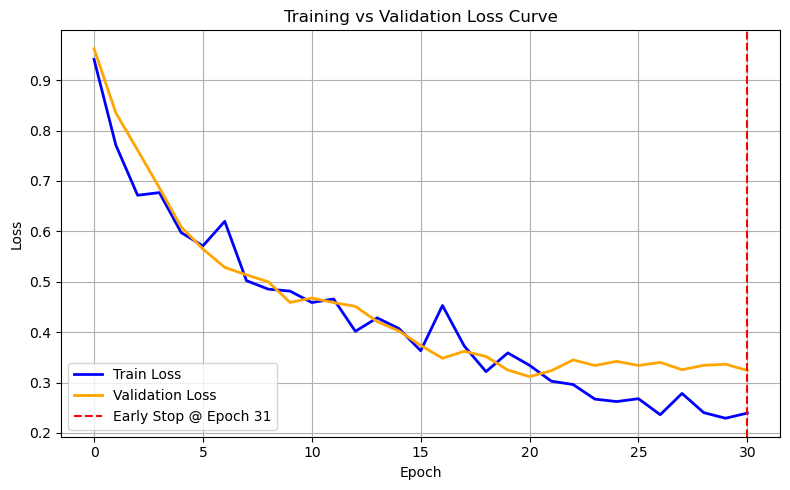

In [695]:
# 🔻 Loss Curve with Early Stopping Marker
plt.figure(figsize=(8, 5))
plt.plot(train_losses, label='Train Loss', color='blue', linewidth=2)
plt.plot(val_losses, label='Validation Loss', color='orange', linewidth=2)

# Mark early stopping epoch
if early_stop_epoch != -1:
    plt.axvline(early_stop_epoch, color='red', linestyle='--', label=f"Early Stop @ Epoch {early_stop_epoch+1}")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss Curve")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [696]:
from sklearn.metrics import classification_report, accuracy_score

# Assuming y_test and y_pred are already defined from your previous evaluation

# Define class labels (you can update these if your label encoding is different)
class_names = ['AD', 'CN', 'MCI']

# Accuracy
accuracy = accuracy_score(y_val_true, y_val_preds)
print(f"\n Accuracy: {accuracy:.4f}")

# Precision, Recall, F1-score
print("\n Classification Report:")
print(classification_report(y_val_true, y_val_preds, target_names=class_names))



 Accuracy: 0.9133

 Classification Report:
              precision    recall  f1-score   support

          AD       0.78      0.95      0.85        40
          CN       1.00      0.94      0.97        50
         MCI       0.96      0.87      0.91        60

    accuracy                           0.91       150
   macro avg       0.91      0.92      0.91       150
weighted avg       0.93      0.91      0.92       150



 Test Accuracy: 0.9530
Classification Report (Test Set):
               precision    recall  f1-score   support

          AD       0.98      1.00      0.99        59
          CN       1.00      0.87      0.93        45
         MCI       0.88      0.98      0.93        45

    accuracy                           0.95       149
   macro avg       0.95      0.95      0.95       149
weighted avg       0.96      0.95      0.95       149



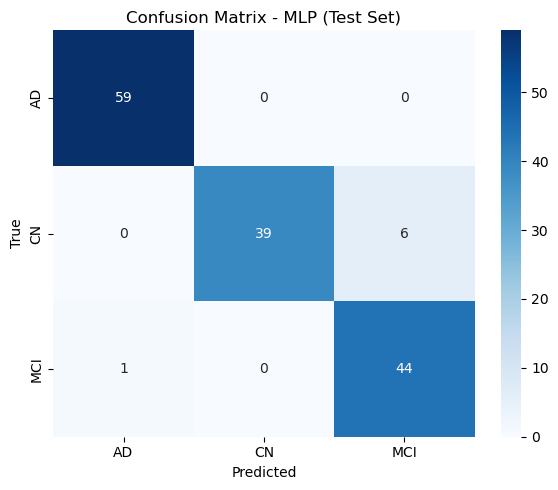

In [ ]:
# -------------------- Load Test Data --------------------
X_test = np.load("test_fused_features.npy")
y_test = np.load("test_fused_labels.npy")

# Scale with the SAME scaler fitted on training data
X_test = scaler.transform(X_test)

# Convert to PyTorch tensors
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Create DataLoader for test set
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

# -------------------- Evaluate on Test Set --------------------
model.eval()  # put model in evaluation mode
y_test_preds = []
y_test_true = []

with torch.no_grad():
    for xb, yb in test_loader:
        xb, yb = xb.to(device), yb.to(device)
        out = model(xb)
        preds = torch.argmax(out, dim=1)
        y_test_preds.extend(preds.cpu().numpy())
        y_test_true.extend(yb.cpu().numpy())

# Test Accuracy
test_acc = accuracy_score(y_test_true, y_test_preds)
print(f" Test Accuracy: {test_acc:.4f}")

# Classification Report
print("Classification Report (Test Set):\n",
      classification_report(y_test_true, y_test_preds, target_names=["AD","CN","MCI"]))

# Confusion Matrix
cm_test = confusion_matrix(y_test_true, y_test_preds)
plt.figure(figsize=(6, 5))
sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues",
            xticklabels=["AD","CN","MCI"], yticklabels=["AD","CN","MCI"])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix - MLP (Test Set)")
plt.tight_layout()
plt.show()

In [ ]:
from captum.attr import IntegratedGradients
import torch, numpy as np

device = torch.device("cpu")
model = model.to(device).eval()

# sample 5 inputs
X_sample = torch.tensor(X_test[:100], dtype=torch.float32, device=device)

# predicted classes
with torch.no_grad():
    preds = torch.argmax(model(X_sample), dim=1)

# baseline = zero vector
baseline = torch.zeros_like(X_sample)

ig = IntegratedGradients(model)

for i in range(X_sample.shape[0]):
    attr = ig.attribute(
        X_sample[i:i+1], baselines=baseline[i:i+1],
        target=int(preds[i]), n_steps=64
    )
    a = attr.squeeze(0).cpu().numpy()

    img_dim = 50176
    img_total  = np.sum(np.abs(a[:img_dim]))
    text_total = np.sum(np.abs(a[img_dim:]))
    print(f"Sample {i}: MRI={img_total:.3f}, TEXT={text_total:.3f}")

attr_np = attr.cpu().numpy()  

img_total_all = np.sum(np.abs(attr_np[:, :img_dim]), axis=1)
text_total_all = np.sum(np.abs(attr_np[:, img_dim:]), axis=1)

print(f"Average MRI contribution: {np.mean(img_total_all):.3f}")
print(f"Average Text contribution: {np.mean(text_total_all):.3f}")

Sample 0: MRI=7.995, TEXT=0.198
Sample 1: MRI=8.327, TEXT=0.221
Sample 2: MRI=8.012, TEXT=0.219
Sample 3: MRI=8.312, TEXT=0.194
Sample 4: MRI=9.110, TEXT=0.231
Sample 5: MRI=8.214, TEXT=0.217
Sample 6: MRI=8.512, TEXT=0.246
Sample 7: MRI=8.752, TEXT=0.225
Sample 8: MRI=8.755, TEXT=0.206
Sample 9: MRI=9.063, TEXT=0.205
Sample 10: MRI=9.378, TEXT=0.236
Sample 11: MRI=9.163, TEXT=0.244
Sample 12: MRI=8.917, TEXT=0.240
Sample 13: MRI=8.471, TEXT=0.225
Sample 14: MRI=8.422, TEXT=0.228
Sample 15: MRI=6.975, TEXT=0.053
Sample 16: MRI=7.096, TEXT=0.055
Sample 17: MRI=8.477, TEXT=0.061
Sample 18: MRI=6.894, TEXT=0.053
Sample 19: MRI=7.940, TEXT=0.057
Sample 20: MRI=8.461, TEXT=0.065
Sample 21: MRI=7.153, TEXT=0.054
Sample 22: MRI=7.284, TEXT=0.056
Sample 23: MRI=8.316, TEXT=0.064
Sample 24: MRI=9.030, TEXT=0.079
Sample 25: MRI=6.918, TEXT=0.052
Sample 26: MRI=8.430, TEXT=0.062
Sample 27: MRI=8.324, TEXT=0.060
Sample 28: MRI=7.313, TEXT=0.055
Sample 29: MRI=8.311, TEXT=0.063
Sample 30: MRI=8.093

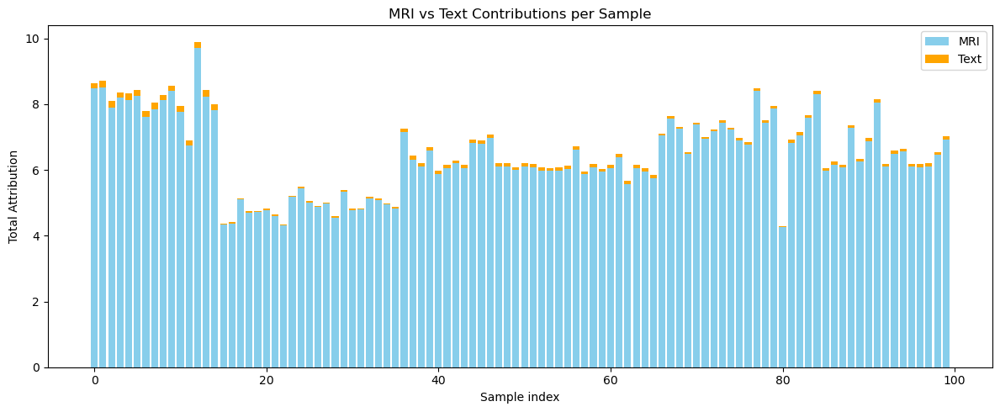

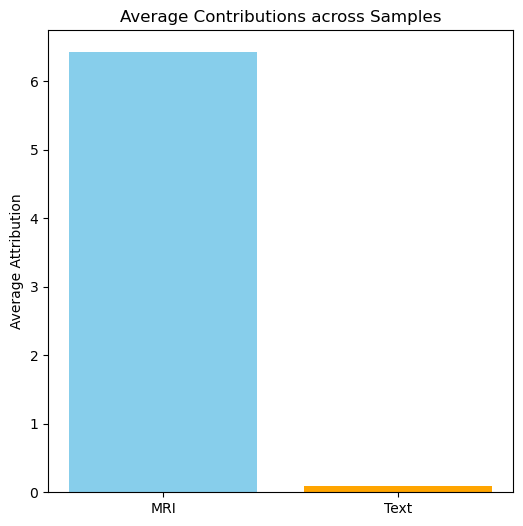

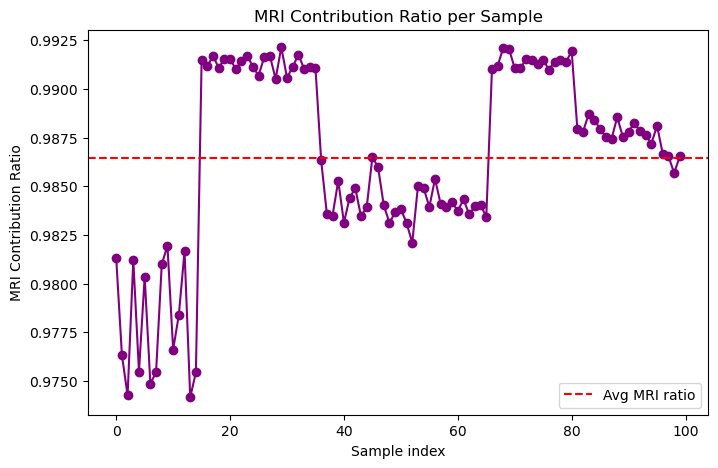

In [ ]:
from captum.attr import IntegratedGradients
import torch, numpy as np
import matplotlib.pyplot as plt

device = torch.device("cpu")
model = model.to(device).eval()

# sample 100 inputs
X_sample = torch.tensor(X_test[:100], dtype=torch.float32, device=device)

# predicted classes
with torch.no_grad():
    preds = torch.argmax(model(X_sample), dim=1)

# baseline = zero vector
baseline = torch.zeros_like(X_sample)
ig = IntegratedGradients(model)

img_contribs, text_contribs = [], []

for i in range(X_sample.shape[0]):
    attr = ig.attribute(
        X_sample[i:i+1], baselines=baseline[i:i+1],
        target=int(preds[i]), n_steps=64
    )
    a = attr.squeeze(0).cpu().numpy()

    img_dim = 50176             # Change this according to the number of features for manai:50176 and CLIP:512
    img_total  = np.sum(np.abs(a[:img_dim]))
    text_total = np.sum(np.abs(a[img_dim:]))
    
    img_contribs.append(img_total)
    text_contribs.append(text_total)

# Convert to numpy arrays
img_contribs  = np.array(img_contribs)
text_contribs = np.array(text_contribs)

# -------- Plot 1: Per-sample stacked bar --------
plt.figure(figsize=(12,5))
ind = np.arange(len(img_contribs))
plt.bar(ind, img_contribs, label="MRI", color="skyblue")
plt.bar(ind, text_contribs, bottom=img_contribs, label="Text", color="orange")
plt.xlabel("Sample index")
plt.ylabel("Total Attribution")
plt.title("MRI vs Text Contributions per Sample")
plt.legend()
plt.tight_layout()
plt.show()

# -------- Plot 2: Average contribution --------
avg_img = np.mean(img_contribs)
avg_text = np.mean(text_contribs)

plt.figure(figsize=(6,6))
plt.bar(["MRI", "Text"], [avg_img, avg_text], color=["skyblue", "orange"])
plt.ylabel("Average Attribution")
plt.title("Average Contributions across Samples")
plt.show()

# -------- Plot 3: Contribution ratio --------
plt.figure(figsize=(8,5))
ratio = img_contribs / (img_contribs + text_contribs + 1e-8)
plt.plot(ratio, marker='o', linestyle='-', color='purple')
plt.axhline(np.mean(ratio), color='red', linestyle='--', label="Avg MRI ratio")
plt.xlabel("Sample index")
plt.ylabel("MRI Contribution Ratio")
plt.title("MRI Contribution Ratio per Sample")
plt.legend()
plt.show()

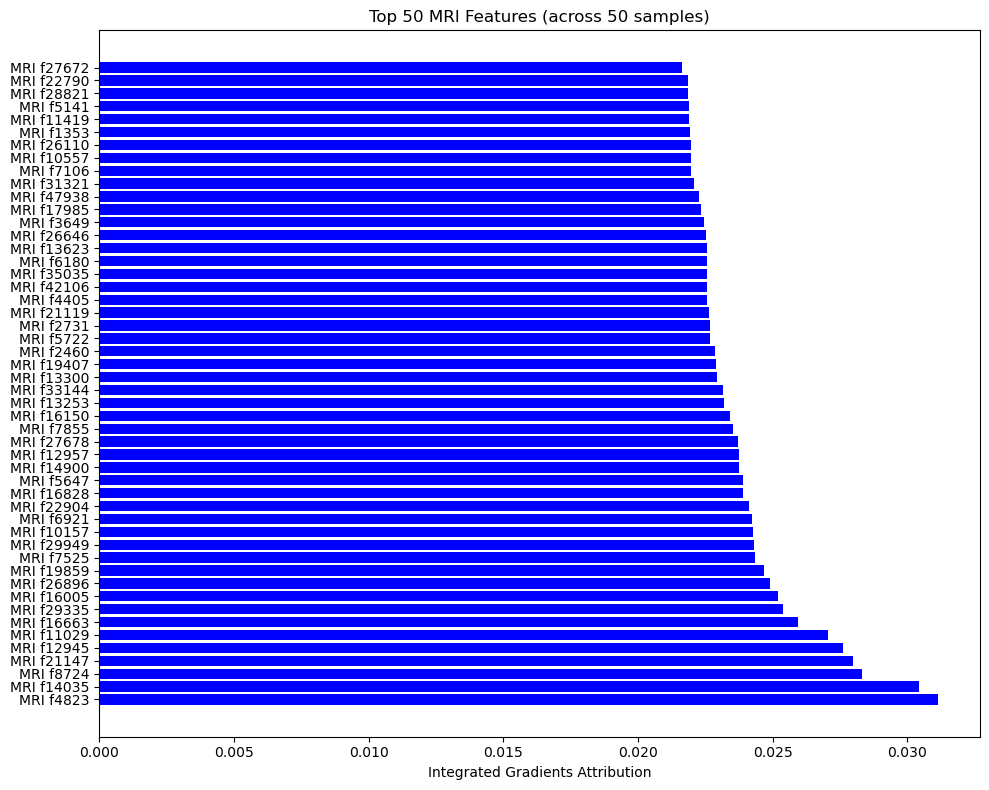

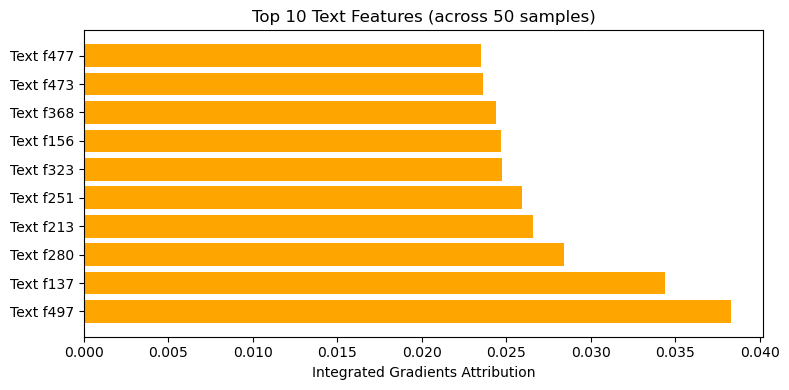

In [ ]:
from captum.attr import IntegratedGradients
import torch, numpy as np
import matplotlib.pyplot as plt

device = torch.device("cpu")
model = model.to(device).eval()

# Take N samples
N = 50
X_sample = torch.tensor(X_test[:N], dtype=torch.float32, device=device)

# Predictions
with torch.no_grad():
    preds = torch.argmax(model(X_sample), dim=1)

baseline = torch.zeros_like(X_sample)
ig = IntegratedGradients(model)

# Collect all attributions
all_attr = []

for i in range(N):
    attr = ig.attribute(
        X_sample[i:i+1],
        baselines=baseline[i:i+1],
        target=int(preds[i]),
        n_steps=64
    )
    all_attr.append(attr.squeeze(0).cpu().numpy())

# Stack into (N, features)
attrs = np.stack(all_attr, axis=0)

# -------------------- Split MRI vs Text --------------------
img_dim = 50176  # flattened MRI features.  # Change this according to the number of features for manai:50176 and CLIP:512
text_dim = 512    # text embedding size

# MRI attribution importance
mri_attr_total = np.sum(np.abs(attrs[:, :img_dim]), axis=0)

# Text attribution importance
text_attr_total = np.sum(np.abs(attrs[:, img_dim:]), axis=0)

# -------------------- Plot MRI (top 50 features) --------------------
K_mri = 50
top_mri_idx = np.argsort(-mri_attr_total)[:K_mri]
top_mri_vals = mri_attr_total[top_mri_idx]

plt.figure(figsize=(10,8))
plt.barh(range(K_mri), top_mri_vals[::-1], color='blue')
plt.yticks(range(K_mri), [f"MRI f{idx}" for idx in top_mri_idx[::-1]])
plt.xlabel("Integrated Gradients Attribution")
plt.title(f"Top {K_mri} MRI Features (across {N} samples)")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# -------------------- Plot Text (top 10 features) --------------------
K_text = 10
top_text_idx = np.argsort(-text_attr_total)[:K_text]
top_text_vals = text_attr_total[top_text_idx]

plt.figure(figsize=(8,4))
plt.barh(range(K_text), top_text_vals[::-1], color='orange')
plt.yticks(range(K_text), [f"Text f{idx}" for idx in top_text_idx[::-1]])
plt.xlabel("Integrated Gradients Attribution")
plt.title(f"Top {K_text} Text Features (across {N} samples)")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

VISUALISE THE RAW DATA FEATURES

/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


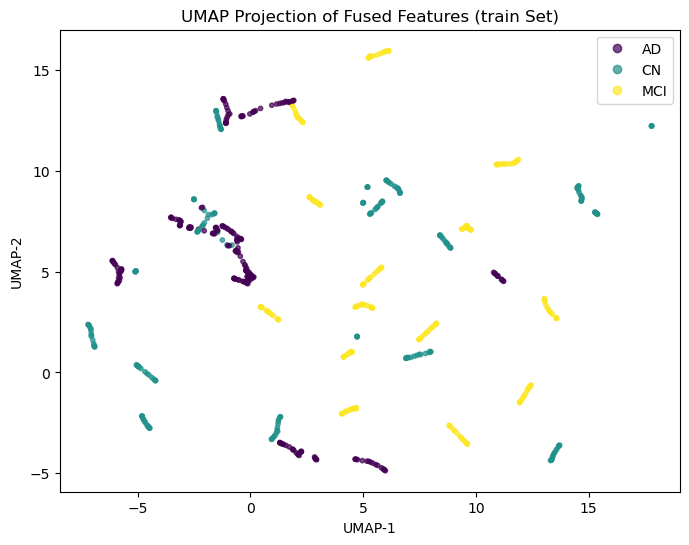

In [701]:
import numpy as np
import matplotlib.pyplot as plt
import umap.umap_ as umap
from sklearn.preprocessing import StandardScaler


# Load your features and labels (you can choose train/train/train)
X = np.load("train_fused_features.npy")  # Shape: (samples, 640)
y = np.load("train_fused_labels.npy")    # Shape: (samples,)

# X = StandardScaler().fit_transform(X)

# Initialize UMAP reducer
reducer = umap.UMAP(
    n_neighbors=4,   # controls local vs global structure
    min_dist=0.1,     # smaller = more clustered points
    n_components=3,   # 2D projection (set 3 for 3D)
    random_state=42
)

# Fit and transform
embedding = reducer.fit_transform(X)  # Shape: (samples, 2)

# Plot
plt.figure(figsize=(8, 6))
scatter = plt.scatter(embedding[:, 0], embedding[:, 1], c=y, cmap='viridis', s=10, alpha=0.7)
plt.legend(handles=scatter.legend_elements()[0], labels=["AD", "CN", "MCI"])
plt.title("UMAP Projection of Fused Features (train Set)")
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.show()

/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


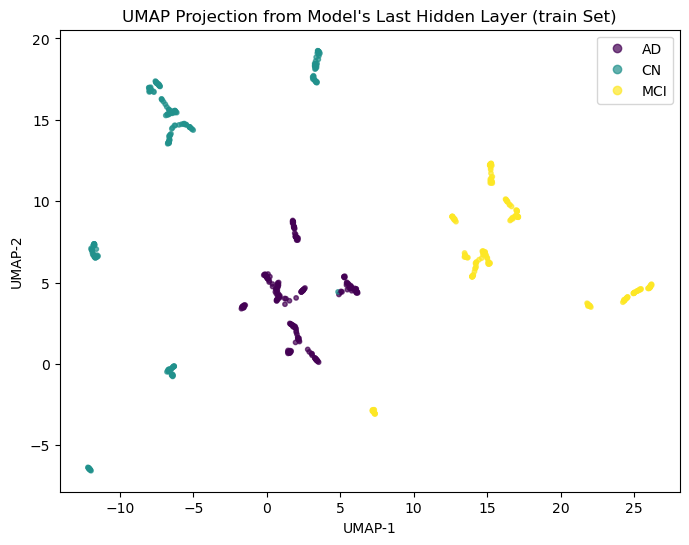

In [702]:
import umap.umap_ as umap
import matplotlib.pyplot as plt
import torch
import numpy as np

# Function to extract embeddings from the trained model
def get_embeddings(model, dataloader, device):
    model.eval()
    embeddings = []
    labels = []

    # Extract everything except the final classification layer
    feature_extractor = torch.nn.Sequential(*list(model.net.children())[:-1])

    with torch.no_grad():
        for xb, yb in dataloader:
            xb = xb.to(device)
            feats = feature_extractor(xb)  # shape: (batch, 64)
            embeddings.append(feats.cpu().numpy())
            labels.append(yb.numpy())

    embeddings = np.vstack(embeddings)
    labels = np.hstack(labels)
    return embeddings, labels

# Get embeddings for your train set
train_embeddings, train_labels = get_embeddings(model, train_loader, device)

# Scale for UMAP
from sklearn.preprocessing import StandardScaler
scaled_embeds = StandardScaler().fit_transform(train_embeddings)

# UMAP projection to 2D
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
umap_embeds = reducer.fit_transform(scaled_embeds)

# Plot
plt.figure(figsize=(8, 6))
scatter = plt.scatter(umap_embeds[:, 0], umap_embeds[:, 1], c=train_labels, cmap='viridis', s=10, alpha=0.7)
plt.legend(handles=scatter.legend_elements()[0], labels=["AD", "CN", "MCI"])
plt.title("UMAP Projection from Model's Last Hidden Layer (train Set)")
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.show()